# Sentiment Analysis Data Storytelling

### Import necessary libraries

In [269]:
# Dataframe
import pandas as pd

# Array
import numpy as np

# Decompress the file
import gzip

# Visualizations
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import seaborn as sns
import matplotlib.colors as colors
%matplotlib inline
from wordcloud import WordCloud, STOPWORDS

# Datetime
from datetime import datetime

# text preprocessing
import spacy
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk.tokenize import word_tokenize, sent_tokenize, regexp_tokenize
from nltk.tokenize import RegexpTokenizer
from nltk.tokenize.toktok import ToktokTokenizer
import re
from bs4 import BeautifulSoup
from contractions import CONTRACTION_MAP
import unicodedata
tokenizer = ToktokTokenizer()
nlp = spacy.load('en', parse=True, tag=True, entity=True)

## Warnings
import warnings
from scipy import stats
warnings.filterwarnings('ignore')

### Reading the Cleaned Dataset

In [270]:
# Read the file
df2 = pd.read_csv('C:/users/eturk/Data_Science/Capstone_Project-Sentiment_Analysis/dataset/cleaned_review_beauty.csv')

### Inspecting the dataset

In [3]:
# Sample observations
df2.sample(3)

,customer,product,rating,review_text,pos_feedback,neg_feedback,rating_class,time,clean_text,tokens
15583,A7OCP4P0S4YO8,B00AE07BDU,3.0,Axe is a favorite My son has used every produc...,0,0,neutral,2013-02-26,axe favorite son use every product axe make lo...,"['axe', 'favorite', 'son', 'use', 'every', 'pr..."
14360,A1P2XYD265YE21,B00A0J084Y,5.0,"Axe Cooling Face Wash, Chilled Axe Cooling Fac...",1,1,good,2013-04-14,axe cool face wash chill axe cool face wash ch...,"['axe', 'cool', 'face', 'wash', 'chill', 'axe'..."
8942,A1QBOC76MIOJYP,B006RFZ8C2,5.0,Biore Blemish Fighting Ice Cleanser This is a ...,0,0,good,2013-05-15,biore blemish fighting ice cleanser nice clean...,"['biore', 'blemish', 'fighting', 'ice', 'clean..."


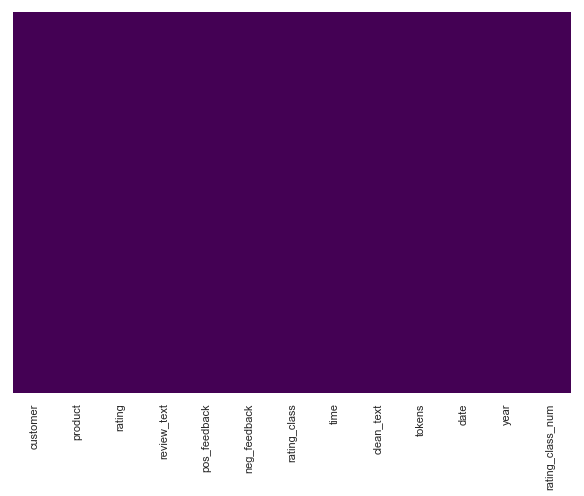

In [53]:
# There is no missing value in the dataset
plt.figure(figsize = (10,7))
sns.set()
_ = sns.heatmap(df2.isnull(), yticklabels=False, cbar = False, cmap = 'viridis')

In [4]:
# Basic Statistics about the dataset
df2.describe()

,rating,pos_feedback,neg_feedback
count,28576.000000,28576.000000,28576.000000
mean,4.170493,0.948488,0.324888
std,0.992277,6.829651,1.105870
min,1.000000,0.000000,0.000000
25%,4.000000,0.000000,0.000000
50%,4.000000,0.000000,0.000000
75%,5.000000,1.000000,0.000000
max,5.000000,549.000000,52.000000


# Exploratory Data Analysis

# Target Variable

## Rating numbers in total

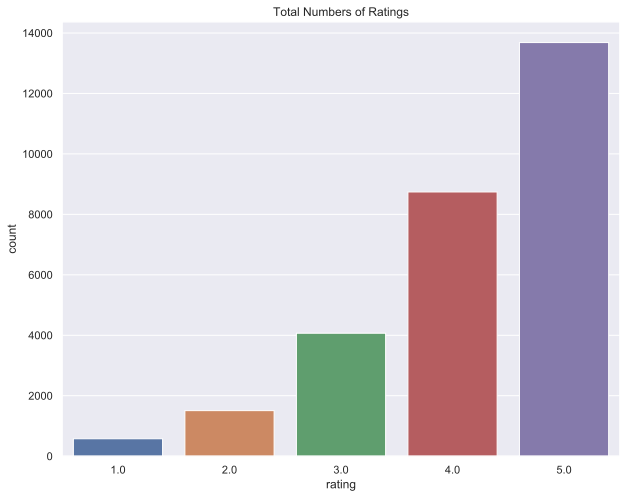

5.0    13683
4.0     8742
3.0     4067
2.0     1508
1.0      576
Name: rating, dtype: int64

In [185]:
# Total numbers of ratings in the beauty product reviews
plt.figure(figsize = (10,8))
sns.countplot(df2['rating'])
plt.title('Total Numbers of Ratings')
plt.show()

# Customer totals for each rating 
df2['rating'].value_counts()

Customers give a rating ranging between 1 to 5 for each beauty product they buy in the Amazon online market. According to the statistics between between 2005-04-13 and 2014-07-23, ratings shows us that customers are averagely satisfied with the product s which they experienced. In order to make more sense, we will categorize those 5 rating categories into three categories such as 'good', 'neutral', and 'bad'. 

## Total Numbers for each Rating Class 

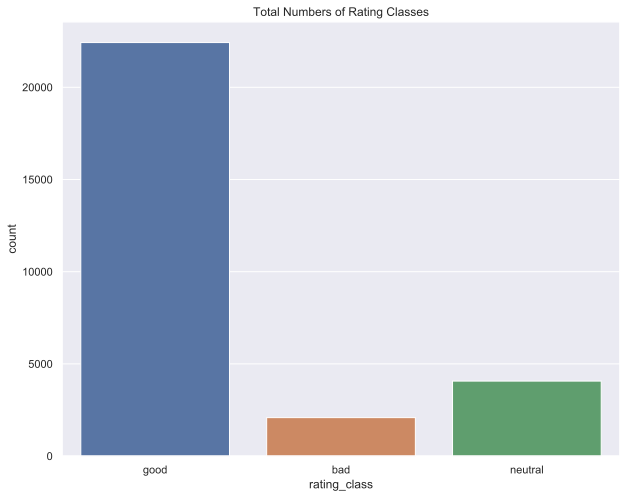

good       22425
neutral     4067
bad         2084
Name: rating_class, dtype: int64

In [186]:
# Total numbers of ratings in the beauty product reviews
plt.figure(figsize = (10,8))
sns.countplot(df2['rating_class'])
plt.title('Total Numbers of Rating Classes')
plt.show()

# Customer totals for each rating class
df2['rating_class'].value_counts()

Customers expressed their experience with Amazon beauty products via giving reviews online. According to those reviews, 78.5% of them (22425)  good, 7.3% of them (2084) is bad, and 14.2% of them (4067) is neutral.  

# Features

## 1. Customer Feature

**Unique Customers**

In [187]:
# How many unique customers do we have in the dataset?
print('Number of unique customers: {}'.format(len(df2['customer'].unique())))

Number of unique customers: 1340


In [271]:
# Create a 'year' column to see the number of customers in each year
df2['date'] = pd.to_datetime(df2['time'])
df2['year']= df2['date'].dt.year
df2.sample()

,customer,product,rating,review_text,pos_feedback,neg_feedback,rating_class,time,clean_text,tokens,date,year
10626,A301B6L3TCD7WL,B007RTR8UW,4.0,African Hair - Not Bad Every once in awhile I don't need a super-rich therapy type conditioner. This works well for that for my thick hair. Suave type produ...,1,1,good,2012-06-18,african hair not bad every awhile not need super rich therapy type conditioner work well thick hair suave type product leave scalp itchy uncomfortable work ...,"['african', 'hair', 'not', 'bad', 'every', 'awhile', 'not', 'need', 'super', 'rich', 'therapy', 'type', 'conditioner', 'work', 'well', 'thick', 'hair', 'sua...",2012-06-18,2012


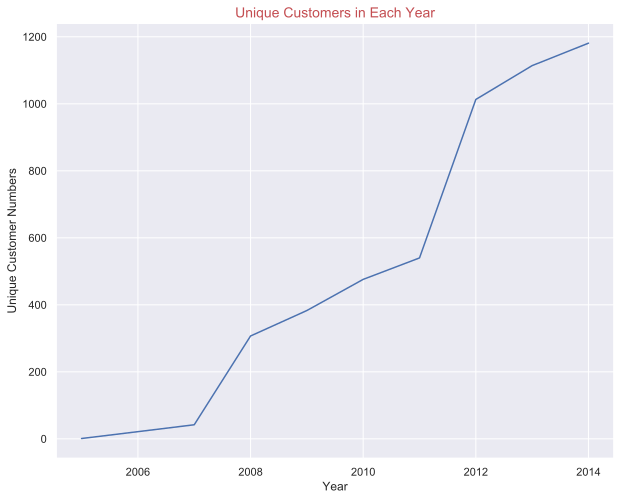

year
2005       1
2007      42
2008     307
2009     383
2010     476
2011     540
2012    1013
2013    1114
2014    1181
Name: customer, dtype: int64


In [189]:
# How many unique customers in each year?
unique_cust = df2.groupby('year')['customer'].nunique()

# Plot unique customer numbers in each year
plt.figure(figsize = (10,8))
unique_cust.plot()
plt.title('Unique Customers in Each Year', color='r', size = 14)
plt.xlabel('Year')
plt.ylabel('Unique Customer Numbers')
plt.show()

# Print unique customer numbers in each year
print(unique_cust)

We have total 1340 unique customers in the dataset which belongs to year between 2005 and 2014. As it may be observed in the chart and table, the number of unique customers for each year has increased with the progress of the year. 

**Customers and Number of Reviews**

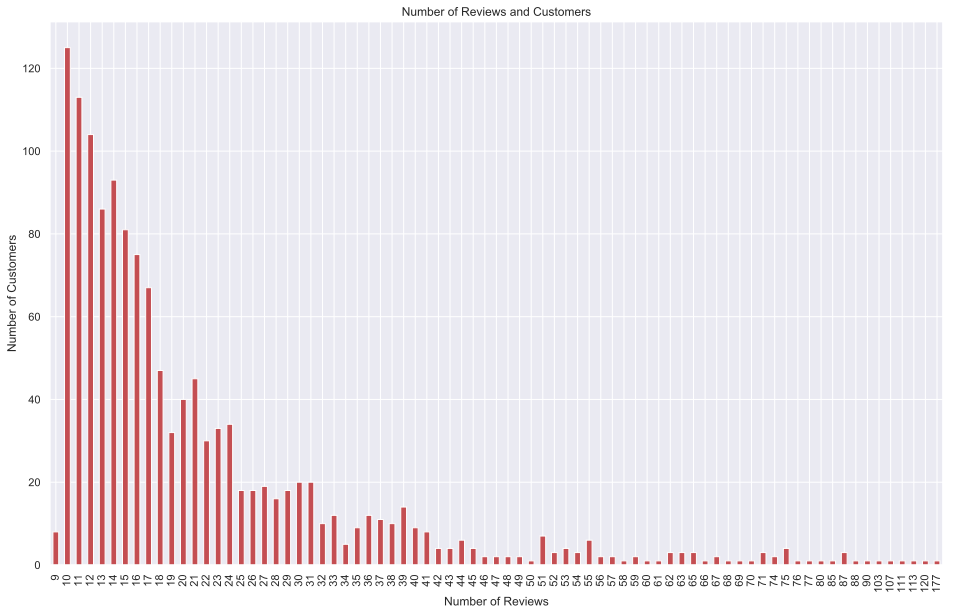

The customers gave reviews between 2005-04-13 and 2014-07-23 for Amazon beauty products.


In [190]:
# Plot relationship between customer and review numbers
plt.figure(figsize = (16,10))
df_dep = (df2['customer'].value_counts()).value_counts().sort_index()
df_dep.plot.bar(color = 'r')
plt.xlabel('Number of Reviews')
plt.ylabel('Number of Customers')
plt.title('Number of Reviews and Customers')
plt.show()

print('The customers gave reviews between {x} and {y} for Amazon beauty products.'.format(x =min(df2['time']), y = max(df2['time'])))

In the whole dataset, customers give reviews ranging between 9 and 177 numbers for Amazon beauty products as it may be observed  in the chart above. Mostly, customers gave 10-20 reviews. Let's see how that picture looks likes in each below. For that, I will create a function and then plot each year's review-customer chart.  

In [259]:
# Plot relationship between customer and review numbers in each year
def customer_review(x):
    plt.figure(figsize = (12,8))
    df2_ = df2[df2['year'] == x]
    df_cust_rev = (df2_['customer'].value_counts()).value_counts().sort_index()
    df_cust_rev.plot.bar(color = 'r', rot=0)
    plt.xlabel('Number of Reviews')
    plt.ylabel('Number of Customers')
    plt.title('Number of Reviews and Customers in'+" "+ str(x))
    plt.show()
    df_cust_rev = (df2_['customer'].value_counts()).value_counts().sort_index()
    print(df_cust_rev)

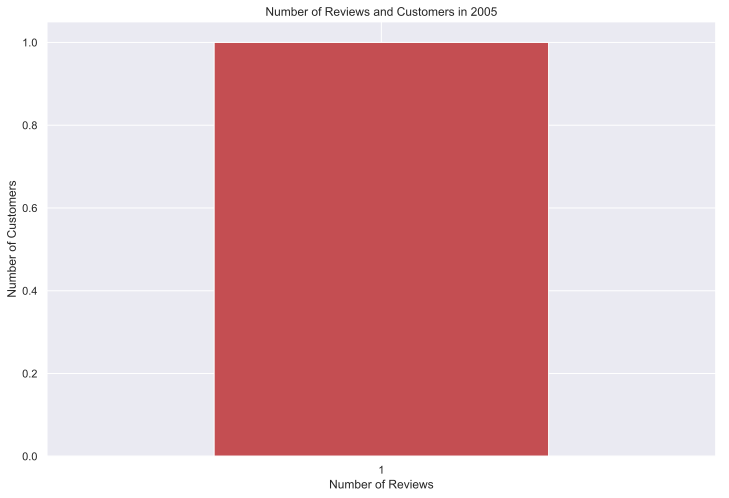

1    1
Name: customer, dtype: int64


In [260]:
# The number of reviews given by the number of customers in 2005
customer_review(2005)

In 2005, only one customer gave one reviews for Amazon beauty product online. 

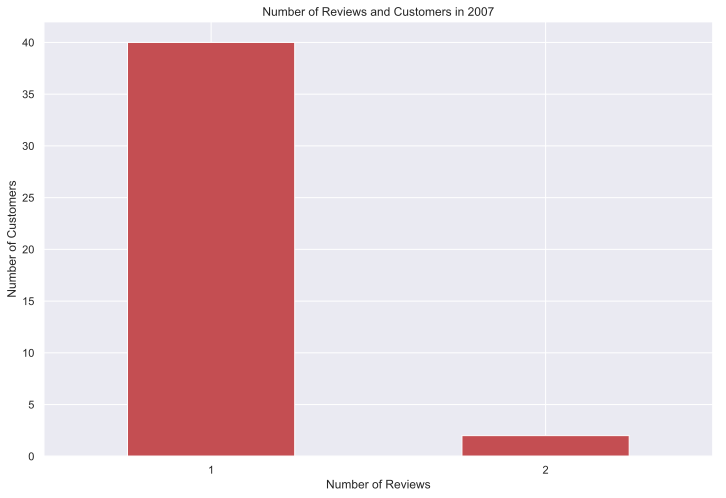

1    40
2     2
Name: customer, dtype: int64


In [193]:
# The number of reviews given by the number of customers in 2007
customer_review(2007)

In 2007, 42 unique customers gave online reviews for 3 unique Amazon beauty products. In detail, 40 of them gave one review, and 2 of them gave only 2 reviews.

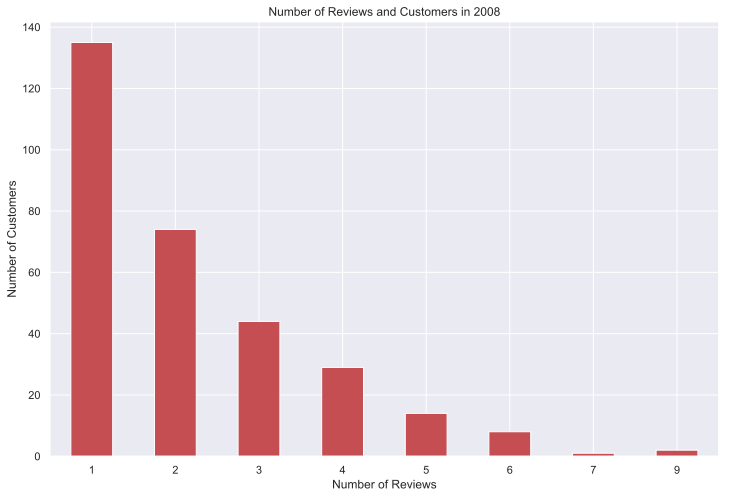

1    135
2     74
3     44
4     29
5     14
6      8
7      1
9      2
Name: customer, dtype: int64


In [194]:
# The number of reviews given by the number of customers in 2008
customer_review(2008)

In 2008, 307 unique customers gave reviews for 26 unique Amazon beauty products. Mostly, customers prefered to give 1-3 reviews and giving more than 6 reviews is very rare. 

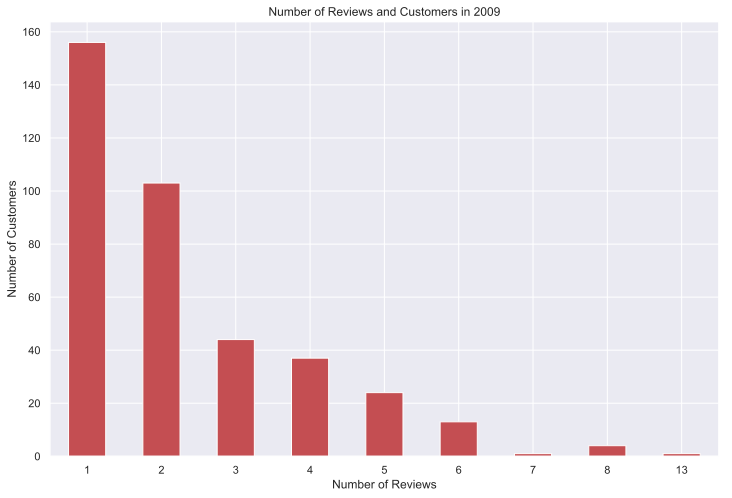

1     156
2     103
3      44
4      37
5      24
6      13
7       1
8       4
13      1
Name: customer, dtype: int64


In [195]:
# The number of reviews given by the number of customers in 2009
customer_review(2009)

In 2009, 383 unique customers gave reviews for 37 unique Amazon beauty products. Mostly, customers prefered to give 1-2 reviews and giving more than 6 reviews is very rare. 

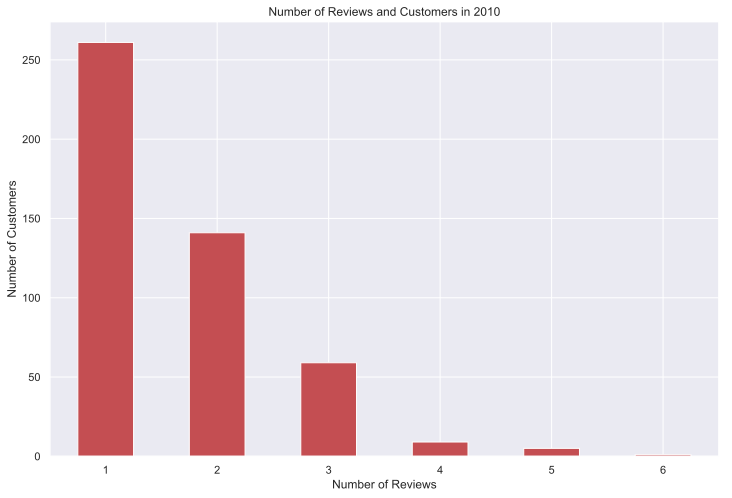

1    261
2    141
3     59
4      9
5      5
6      1
Name: customer, dtype: int64


In [196]:
# The number of reviews given by the number of customers in 2010
customer_review(2010)

In 2010, 476 unique customers gave reviews for 49 unique Amazon beauty products. Mostly, customers prefered to give 1-3 reviews and giving more than 3 reviews is very rare. 

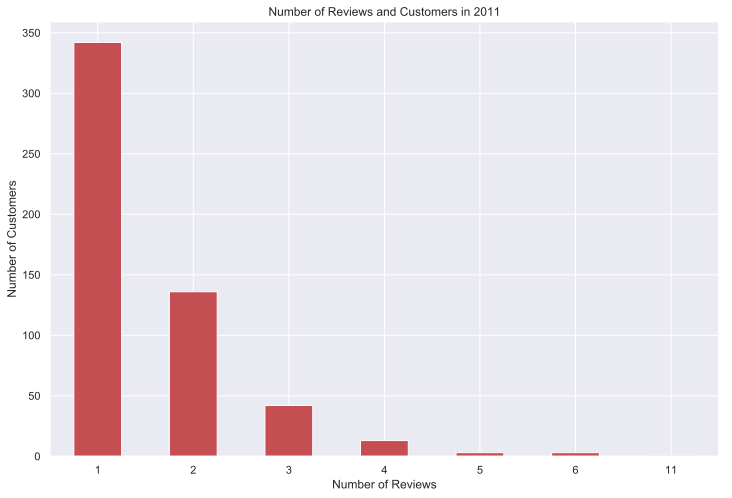

1     342
2     136
3      42
4      13
5       3
6       3
11      1
Name: customer, dtype: int64


In [197]:
# The number of reviews given by the number of customers in 2011
customer_review(2011)

In 2011, 540 unique customers gave reviews for 76 unique Amazon beauty products. Mostly, customers prefered to give 1-2 reviews and giving more than 3 reviews is very rare. 

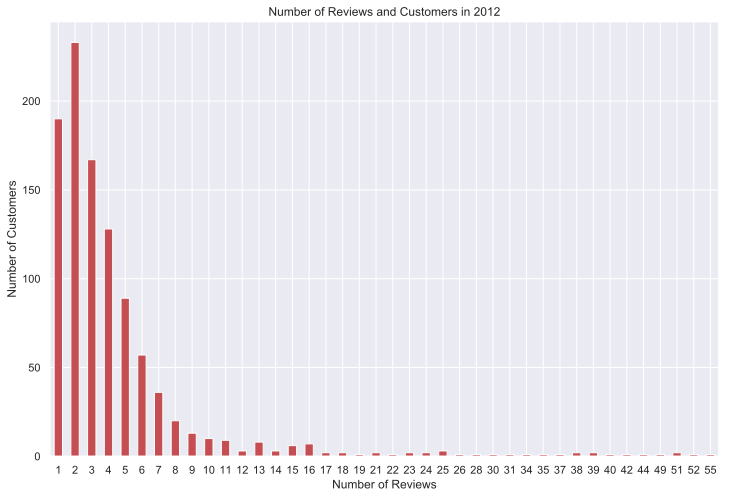

1     190
2     233
3     167
4     128
5      89
6      57
7      36
8      20
9      13
10     10
11      9
12      3
13      8
14      3
15      6
16      7
17      2
18      2
19      1
21      2
22      1
23      2
24      2
25      3
26      1
28      1
30      1
31      1
34      1
35      1
37      1
38      2
39      2
40      1
42      1
44      1
49      1
51      2
52      1
55      1
Name: customer, dtype: int64


In [198]:
# The number of reviews given by the number of customers in 2012
customer_review(2012)

In 2012, 1013 unique customers gave reviews for 119 unique Amazon beauty products. Mostly, customers prefered to give 1-5 reviews and giving more than 10 reviews is very rare. But we still have customers who gave 55 reviews in that year. 

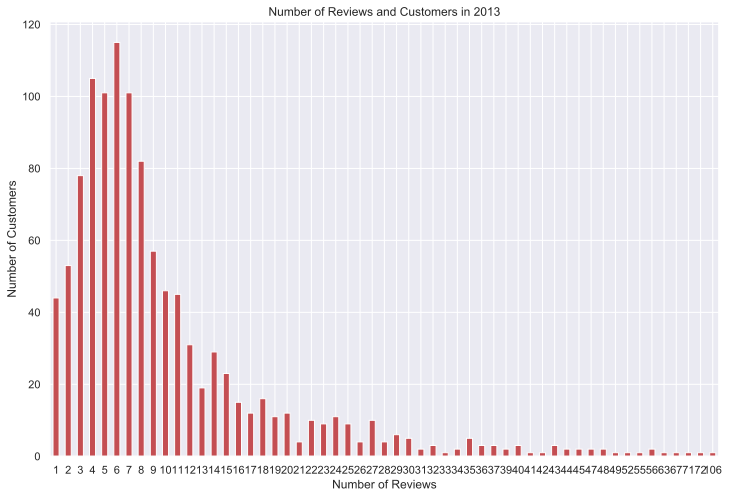

1       44
2       53
3       78
4      105
5      101
6      115
7      101
8       82
9       57
10      46
11      45
12      31
13      19
14      29
15      23
16      15
17      12
18      16
19      11
20      12
21       4
22      10
23       9
24      11
25       9
26       4
27      10
28       4
29       6
30       5
31       2
32       3
33       1
34       2
35       5
36       3
37       3
39       2
40       3
41       1
42       1
43       3
44       2
45       2
47       2
48       2
49       1
52       1
55       1
56       2
63       1
67       1
71       1
72       1
106      1
Name: customer, dtype: int64


In [199]:
# The number of reviews given by the number of customers in 2013
customer_review(2013)

In 2013, 1114 unique customers gave reviews for 306 unique Amazon beauty products. Mostly, customers prefered to give 3-8 reviews and giving more than 27 reviews is very rare. But we still have customers who gave 106 reviews in that year. 

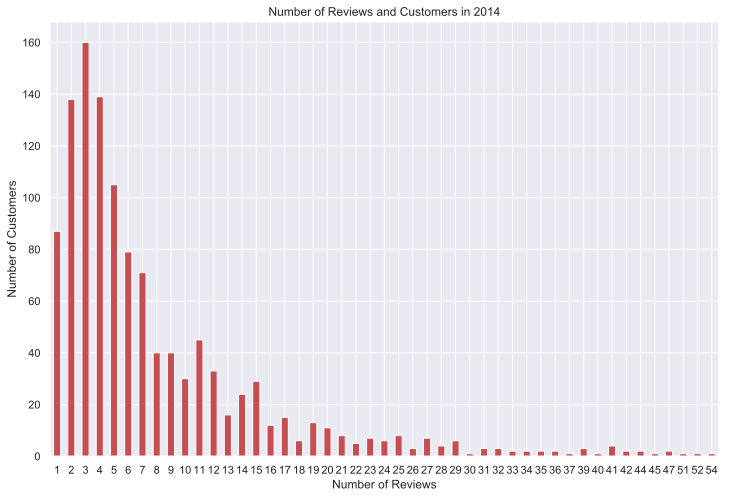

1      87
2     138
3     160
4     139
5     105
6      79
7      71
8      40
9      40
10     30
11     45
12     33
13     16
14     24
15     29
16     12
17     15
18      6
19     13
20     11
21      8
22      5
23      7
24      6
25      8
26      3
27      7
28      4
29      6
30      1
31      3
32      3
33      2
34      2
35      2
36      2
37      1
39      3
40      1
41      4
42      2
44      2
45      1
47      2
51      1
52      1
54      1
Name: customer, dtype: int64


In [200]:
# The number of reviews given by the number of customers in 2014
customer_review(2014)

In 2014, 1181 unique customers gave reviews for 360 unique Amazon beauty products. Mostly, customers prefered to give 1-7 reviews and giving more than 15 reviews is rare. But we still have customers who gave 54 reviews in that year. 

Review per customer: 21.32537313432836


Text(0.5, 1.0, 'Reviews Made by a Single Customer Outliers')

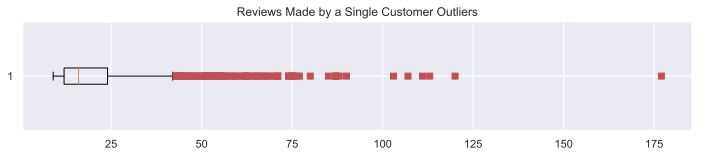

In [201]:
# Detecting outliers of customers who made many reviews.
print('Review per customer: {}'.format((len(df2)/len(df2['customer'].unique()))))
a = np.array(df2['customer'].value_counts())
fig = plt.figure(figsize=(12,2))
plt.boxplot(a, 0, 'rs', 0)
plt.title('Reviews Made by a Single Customer Outliers')

As indicated above, there are some customers who has a large number of reviews and that may be a question mark in the objectiveness of the analysis. 

**How many unique customers do we have in each rating class?**

In [202]:
# unique customers for each "rating class"
a = list(df2.groupby(['rating_class'])['customer'].unique())  

# number of customers
a2 = [len(a[0]),len(a[1]),len(a[2])] 

# number of reviews for each "rating class"
b = list(df2['rating_class'].value_counts())

# customer uniqueness of each "ranting class"
c = [ai/bi for ai,bi in zip(a2, sorted(b))]               

uniq_cust_rate = pd.DataFrame({'rating_class': ['bad', 'neutral', 'good'],
                               'number_of_customers': a2,
                               'number_of_reviews': sorted(b),
                               'customer_uniqueness': ["%.2f" % e for e in c]})
print(uniq_cust_rate)

  rating_class  number_of_customers  number_of_reviews customer_uniqueness
0          bad                  747               2084                0.36
1      neutral                 1340               4067                0.33
2         good                 1034              22425                0.05


"Customer uniquness" is computed as a metric of 'rating class'. The purpose is to understand 'how much were the reviews made by different customers or how much are they  populated by same customers. For example, customer uniquness of 'rating class good" is 0.36, that means 64% of the reviews were given by customers who had made review before. Some customers may populate the review rates which may effect the test scores negatively. For a detailed work, that small nuances may make difference and need to be handled.

**Customers and Review Length**

In [203]:
# Function for creating a column to see the length of the review text
def lenght(text):
    lenght = len([w for w in nltk.word_tokenize(text)])
    return lenght

df2['review_length'] = df2['review_text'].apply(lenght)

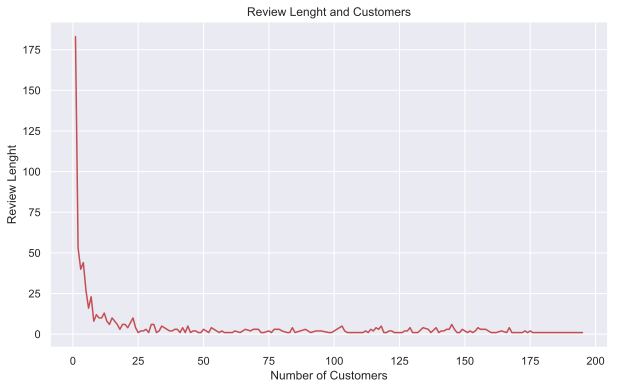

In [210]:
# Ploting length of the reviews written by the number of customers
plt.figure(figsize = (10,6))
df_dep = (df2['review_length'].value_counts()).value_counts().sort_index()
df_dep.plot(color='r')
plt.xlabel('Number of Customers')
plt.ylabel('Review Lenght')
plt.title('Review Lenght and Customers')
plt.show()

Most of the customers tend to make short reviews. 

## 2. Product Feature

**The Number of Unique Products**

In [205]:
# Print number of unique beauty products in the dataset
print('Number of unique beauty products: {}'.format(len(df2['product'].unique())))

Number of unique beauty products: 733


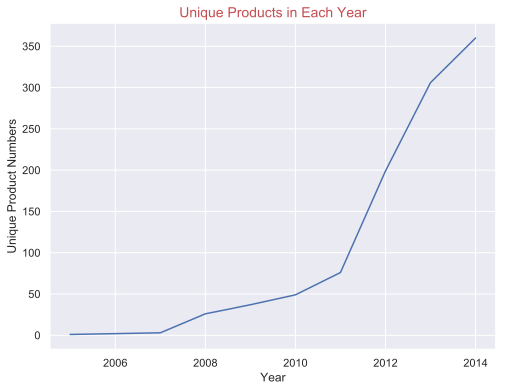

year
2005      1
2007      3
2008     26
2009     37
2010     49
2011     76
2012    199
2013    306
2014    360
Name: product, dtype: int64


In [211]:
# How many unique products in each year?
unique_prod = df2.groupby('year')['product'].nunique()

# Plot unique product numbers in each year
plt.figure(figsize = (8,6))
unique_prod.plot()
plt.title('Unique Products in Each Year', color = 'r', size = 14)
plt.xlabel('Year')
plt.ylabel('Unique Product Numbers')
plt.show()

# Print unique product numbers in each year
print(unique_prod)

We have total 733 unique products in the dataset which belongs to year between 2005 and 2014. As it may be observed in the chart and table, the number of unique products for each year has increased with the progress of the year. 

**Product and Number of Reviews**

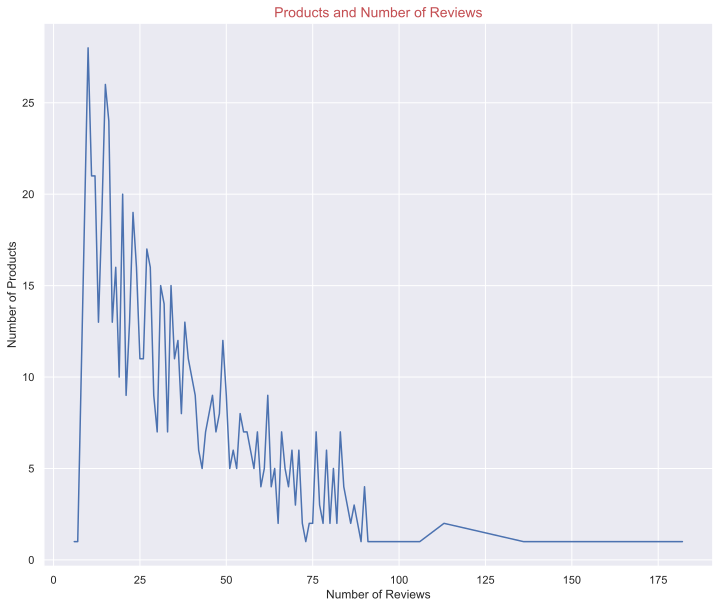

In [214]:
# Plot the number of reviews for the number of products
plt.figure(figsize = (12,10))
df_pro = (df2['product'].value_counts()).value_counts().sort_index()
df_pro.plot(color='b')
plt.xlabel('Number of Reviews')
plt.ylabel('Number of Products')
plt.title('Products and Number of Reviews', color = "r", size = 14)
plt.show()

Number of products are compared with the number of reviews that products received in the chart above. There are some products which really received over 100 reviews. 

In [240]:
# Plot relationship between customer and review numbers in each year
def product_review(x,y):
    plt.figure(figsize = (12,10))
    df2_ = df2[df2['year'] == x]
    df_prod_rev = (df2_['product'].value_counts()).value_counts().sort_index()
    df_prod_rev.plot.bar(color = 'r', rot=y)
    plt.xlabel('Number of Reviews')
    plt.ylabel('Number of Products')
    plt.title('Number of Reviews and Products in'+" "+ str(x))
    plt.show()
    df_prod_rev = (df2_['product'].value_counts()).value_counts().sort_index()
    print(df_prod_rev)

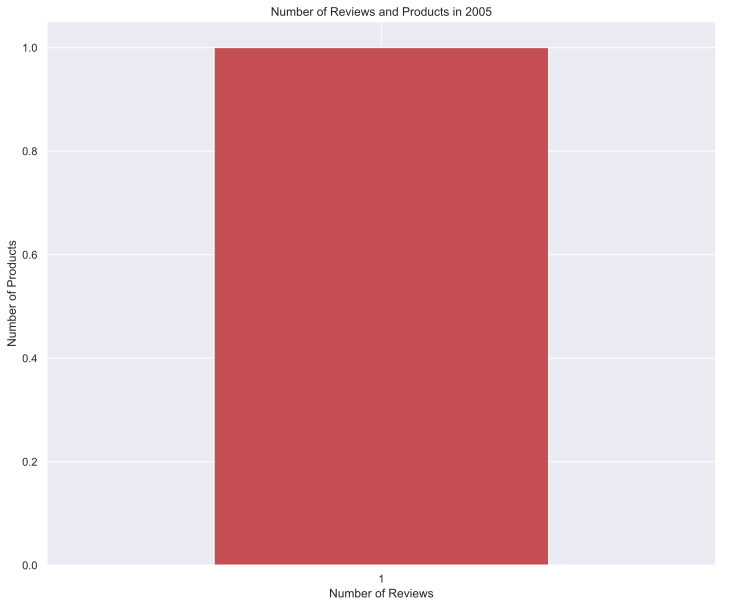

1    1
Name: product, dtype: int64


In [241]:
# The number of reviews per the number of products in 2005
product_review(2005, 0)

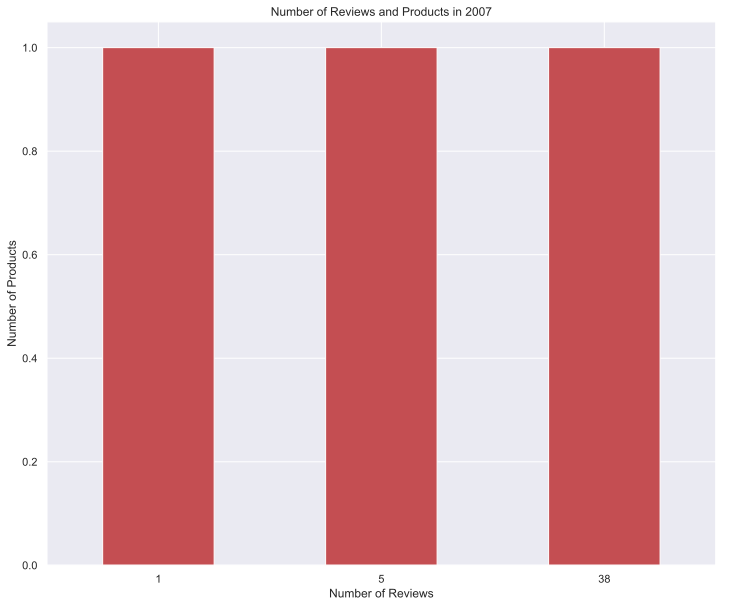

1     1
5     1
38    1
Name: product, dtype: int64


In [242]:
# The number of reviews per the number of products in 2007
product_review(2007, 0)

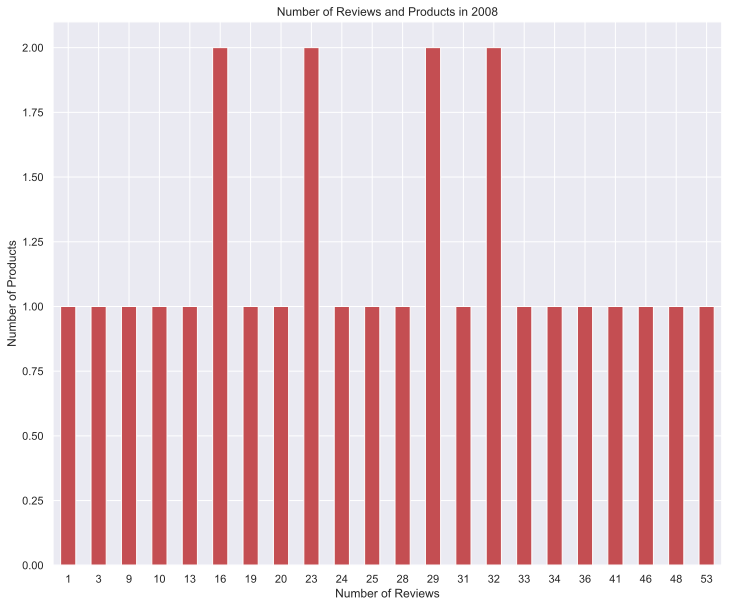

1     1
3     1
9     1
10    1
13    1
16    2
19    1
20    1
23    2
24    1
25    1
28    1
29    2
31    1
32    2
33    1
34    1
36    1
41    1
46    1
48    1
53    1
Name: product, dtype: int64


In [243]:
# The number of reviews per the number of products in 2008
product_review(2008,0)

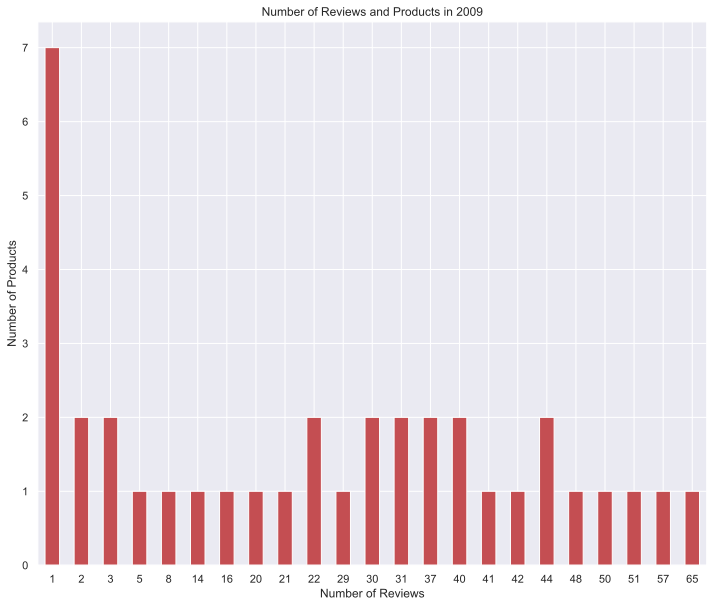

1     7
2     2
3     2
5     1
8     1
14    1
16    1
20    1
21    1
22    2
29    1
30    2
31    2
37    2
40    2
41    1
42    1
44    2
48    1
50    1
51    1
57    1
65    1
Name: product, dtype: int64


In [244]:
# The number of reviews per the number of products in 2009
product_review(2009,0)

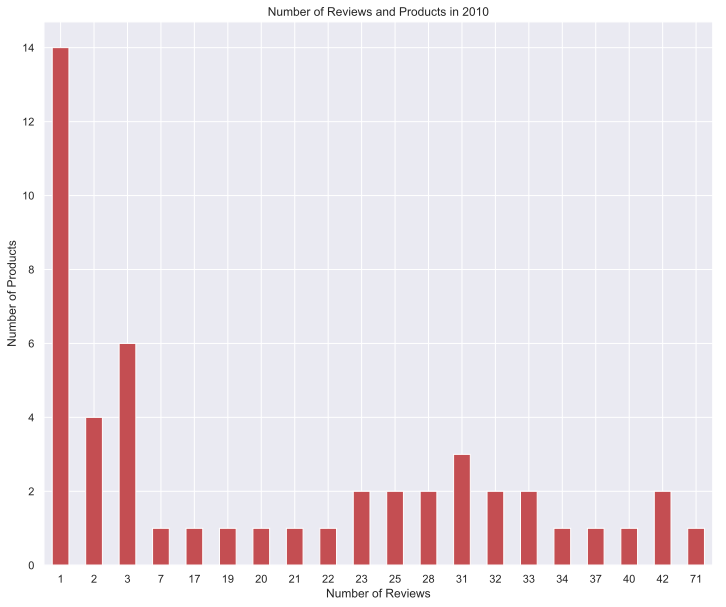

1     14
2      4
3      6
7      1
17     1
19     1
20     1
21     1
22     1
23     2
25     2
28     2
31     3
32     2
33     2
34     1
37     1
40     1
42     2
71     1
Name: product, dtype: int64


In [245]:
# The number of reviews per the number of products in 2010
product_review(2010,0)

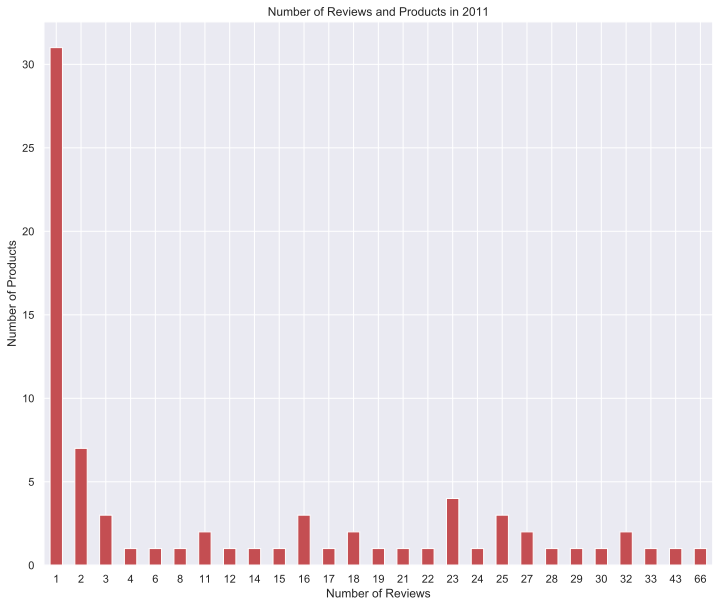

1     31
2      7
3      3
4      1
6      1
8      1
11     2
12     1
14     1
15     1
16     3
17     1
18     2
19     1
21     1
22     1
23     4
24     1
25     3
27     2
28     1
29     1
30     1
32     2
33     1
43     1
66     1
Name: product, dtype: int64


In [246]:
# The number of reviews per the number of products in 2011
product_review(2011, 0)

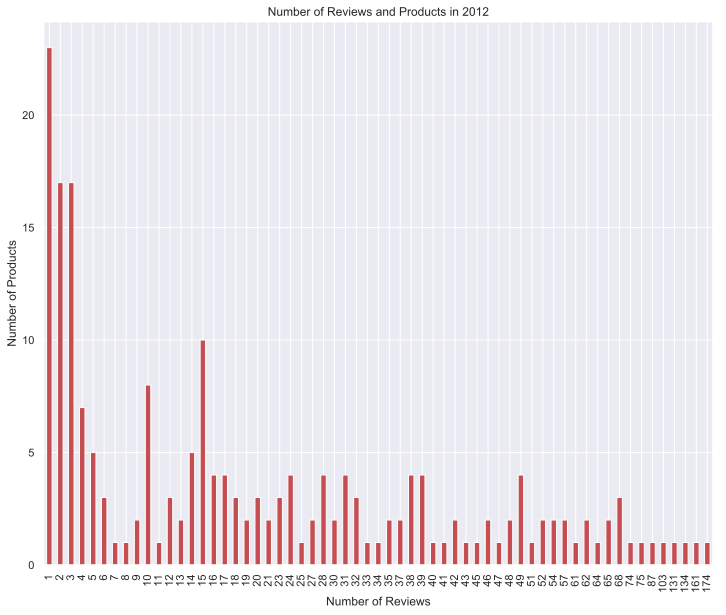

1      23
2      17
3      17
4       7
5       5
6       3
7       1
8       1
9       2
10      8
11      1
12      3
13      2
14      5
15     10
16      4
17      4
18      3
19      2
20      3
21      2
23      3
24      4
25      1
27      2
28      4
30      2
31      4
32      3
33      1
       ..
35      2
37      2
38      4
39      4
40      1
41      1
42      2
43      1
45      1
46      2
47      1
48      2
49      4
51      1
52      2
54      2
57      2
61      1
62      2
64      1
65      2
68      3
74      1
75      1
87      1
103     1
131     1
134     1
161     1
174     1
Name: product, Length: 61, dtype: int64


In [247]:
# The number of reviews per the number of products in 2012
product_review(2012, 90)

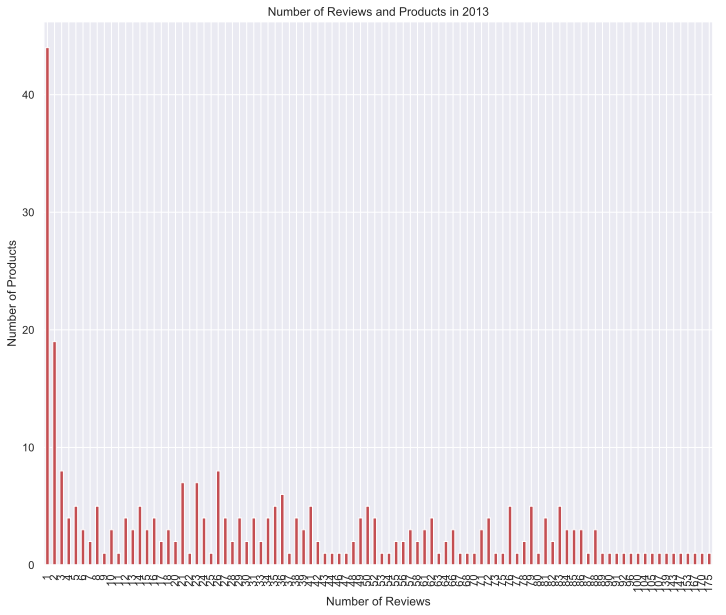

1      44
2      19
3       8
4       4
5       5
6       3
7       2
8       5
9       1
10      3
11      1
12      4
13      3
14      5
15      3
16      4
17      2
18      3
20      2
21      7
22      1
23      7
24      4
25      1
26      8
27      4
28      2
29      4
30      2
31      4
       ..
75      1
76      5
77      1
78      2
79      5
80      1
81      4
82      2
83      5
84      3
85      3
86      3
87      1
88      3
89      1
90      1
91      1
92      1
96      1
100     1
104     1
105     1
107     1
139     1
143     1
147     1
153     1
167     1
170     1
175     1
Name: product, Length: 94, dtype: int64


In [249]:
# The number of reviews per the number of products in 2013
product_review(2013, 90)

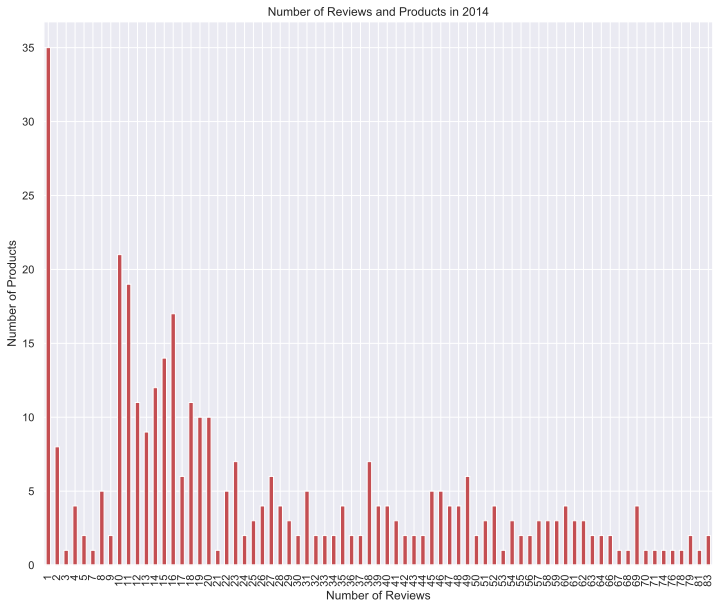

1     35
2      8
3      1
4      4
5      2
7      1
8      5
9      2
10    21
11    19
12    11
13     9
14    12
15    14
16    17
17     6
18    11
19    10
20    10
21     1
22     5
23     7
24     2
25     3
26     4
27     6
28     4
29     3
30     2
31     5
      ..
47     4
48     4
49     6
50     2
51     3
52     4
53     1
54     3
55     2
56     2
57     3
58     3
59     3
60     4
61     3
62     3
63     2
64     2
66     2
67     1
68     1
69     4
70     1
71     1
74     1
76     1
78     1
79     2
81     1
83     2
Name: product, Length: 75, dtype: int64


In [250]:
# The number of reviews per the number of products in 2014
product_review(2014, 90)

**Outlier products (in regards of number of reviews)**

Review per product: 38.9849931787176


Text(0.5, 1.0, 'Reviews made for a single product')

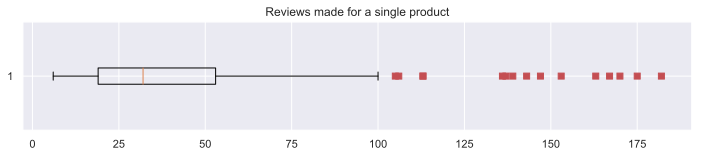

In [230]:
# Detect the outliers of products which have received reviews more than normal.
print('Review per product: {}'.format((len(df2)/len(df2['product'].unique()))))
a = np.array(df2['product'].value_counts())
fig = plt.figure(figsize=(12,2))
plt.boxplot(a, 0, 'rs', 0)
plt.title('Reviews made for a single product')

There are outlier products.

These outlier may be considered in two different aspects:

- The first one, most probably, reviews which were made for a single product share the same or similar words, and this fact may effect the test score.

- The second one, reviews of outlier products may give clues about the strong and weak points of the related products.

## 3. Feedback Features

**Positive Feedback and Rating Class Comparison**

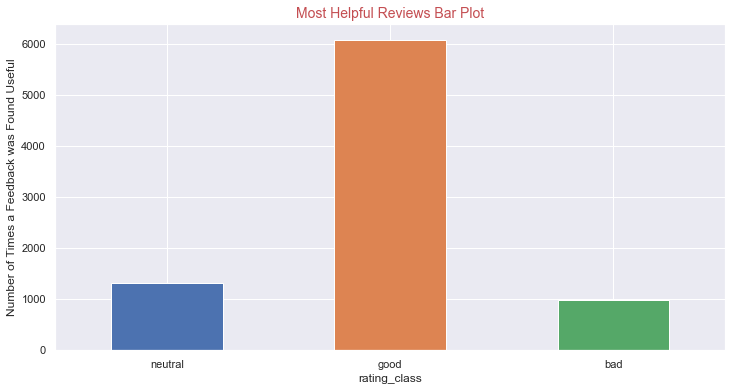

rating_class
bad         984
good       6089
neutral    1324
Name: positive_feedback_count, dtype: int64


In [155]:
# Create another column for ploting and tabling positive feedback number for each rating class
df2['positive_feedback_count'] = df2[df2['pos_feedback']>0]

# Plot positive feedback numbers for each rating class
plt.figure(figsize = (12,6))
df_class = df2.groupby('rating_class')['positive_feedback_count'].count().iloc[::-1]
df_class.plot.bar()
plt.xlabel('rating_class')
plt.ylabel('Number of Times a Feedback was Found Useful')
plt.title('Most Helpful Reviews Bar Plot', color = 'r', size = 14)
plt.xticks(rotation = 0)
plt.show()

# Print positive feedback numbers for each rating class
outcome1 = df2.groupby('rating_class')['positive_feedback_count'].count()
print(outcome1)

**Positive Feedback and Rating Classes**

In [272]:
df2['rating_class_num'] = df2['rating_class'].map({'good': 3, 'bad': 1, 'neutral': 2})

In [262]:
# Plotting relationship between positive feedback and rating classes
sns.set()
plt.figure(figsize = (12,6))
_ = plt.scatter(df2['rating_class'], df2['pos_feedback'], color = 'green', marker = '.', norm = True)

xm, ym = np.polyfit(df2['rating_class_num'], df2['pos_feedback'], 1)

# Make theoretical line to plot
x = np.array([0,2])
y_m = xm * x + ym

# Add regression line to your plot
_ = plt.plot(x, y_m, color='red')
_ = plt.ylabel('Positive Feedback Count')
_ = plt.xlabel('Rating')
_ = plt.title('Correlation Between Rating and Positive Feedback Count', size = 14)
plt.margins(0.02)

Comment = ? The correlation between positive and negative feedback is very small and neglectable. 

**Outlier positive feedbacks (in regards of number of feedbacks)**

Text(0.5, 1.0, 'Positive Feedback Outliers')

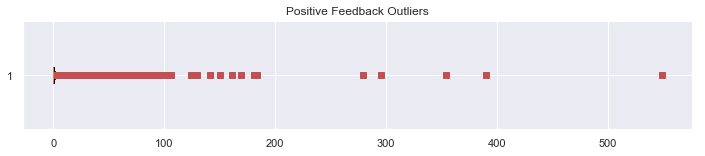

In [151]:
# Visualizing postive feedback ouliers
fig = plt.figure(figsize=(12,2))
plt.boxplot(df2['pos_feedback'], 0, 'rs', 0)
plt.title('Positive Feedback Outliers')

Postive feedback outliers can provide the information of what customers like most about a specific product, and company can use this information for further improvements of the related products. 

**Negative Feedbacks and Ratings**

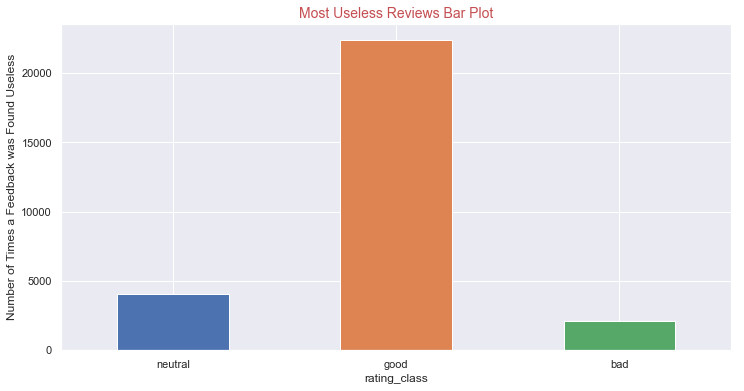

rating_class
bad         2084
good       22425
neutral     4067
Name: negative_feedback_count, dtype: int64


In [154]:
# Create another column for ploting and tabling negative feedback number for each rating class
df2['negative_feedback_count'] = df2['neg_feedback']>0

# Plot positive feedback numbers for each rating class
plt.figure(figsize = (12,6))
df_class = df2.groupby('rating_class')['negative_feedback_count'].count().iloc[::-1]
df_class.plot.bar()
plt.xlabel('rating_class')
plt.ylabel('Number of Times a Feedback was Found Useless')
plt.title('Most Useless Reviews Bar Plot', color = 'r', size = 14)
plt.xticks(rotation = 0)
plt.show()

# Print positive feedback numbers for each rating class
outcome2 = df2.groupby('rating_class')['negative_feedback_count'].count()
print(outcome2)

In [273]:
# Plotting relationship between negative feedback and rating classes
sns.set()
plt.figure(figsize = (12,6))
_ = plt.scatter(df2['rating_class'], df2['neg_feedback'], color = 'black', marker = 'o', norm = True)

xm, ym = np.polyfit(df2['rating_class_num'], df2['neg_feedback'], 1)

# Make theoretical line to plot
x = np.array([0,2])
y_m = xm * x + ym

# Add regression line to your plot
_ = plt.plot(x, y_m, color='red')
_ = plt.ylabel('Negative Feedback Count')
_ = plt.xlabel('Rating')
_ = plt.title('Correlation Between Rating and Negative Feedback Count', size = 14)
plt.margins(0.02)

Comment: ? There is a negative corelation between negative feedback and rating variables but it is not strong.

**Outlier Negative Feedbacks(in regards of number of feedbacks**

Text(0.5, 1.0, 'Negative Feedback Outliers')

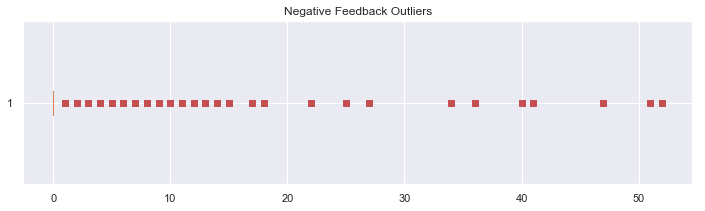

In [58]:
# visualizing postive_feedback ouliers
fig = plt.figure(figsize=(12,3))
plt.boxplot(df2['neg_feedback'], 0, 'rs', 0)
plt.title('Negative Feedback Outliers')

Comment: ? Negative feedback outliers can provide the information of what customers like most about a specific product, and company can use this information for further improvements of the related products.

# 4. Review Length Feature

**Review Lenght Distribution Plot**

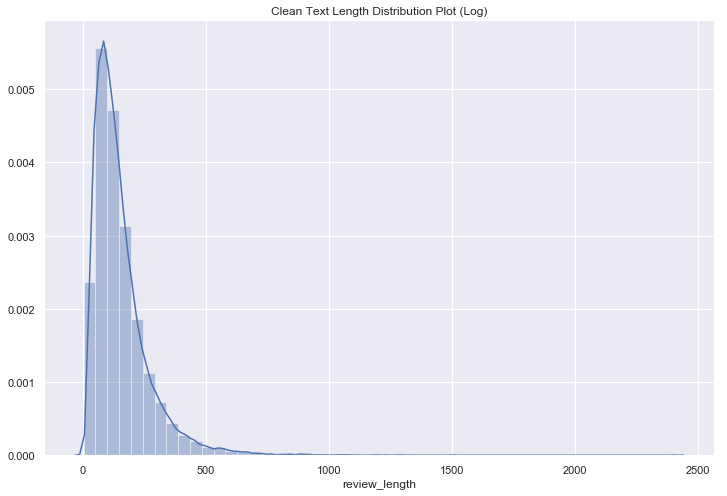

In [107]:
# Visualizing the review length distribution plot
plt.figure(figsize = (12,8))
sns.distplot(df2['review_length'])
_ = plt.xlabel('review_length')
_ = plt.title('Clean Text Length Distribution Plot (Log)')

**Review Length and Rating Class**

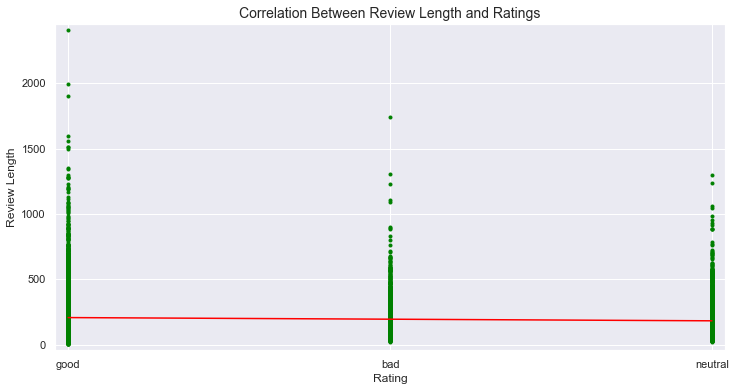

In [61]:
# Plotting the relationship between review length and rating classes
sns.set()
plt.figure(figsize = (12,6))
_ = plt.scatter(df2['rating_class'], df2['review_length'], color = 'green', marker = '.', norm = True)

xm, ym = np.polyfit(df2['rating'], df2['review_length'], 1)

# Make theoretical line to plot
x = np.array([0,2])
y_m = xm * x + ym

# Add regression line to your plot
_ = plt.plot(x, y_m, color='red')
_ = plt.ylabel('Review Length')
_ = plt.xlabel('Rating')
_ = plt.title('Correlation Between Review Length and Ratings', size = 14)
plt.margins(0.02)

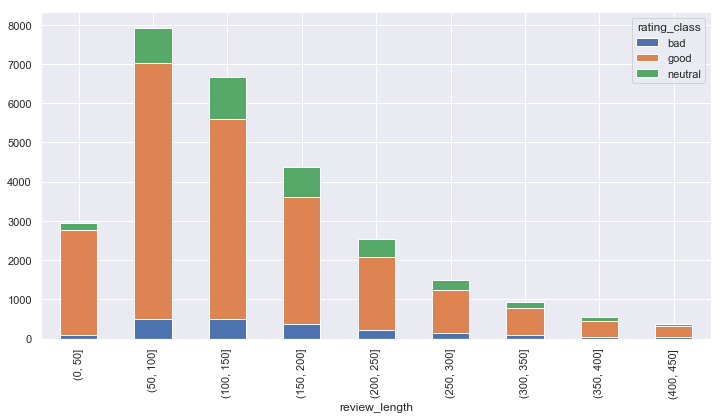

In [66]:
# Plotting review length and rating classes in bar graph
plt.rcParams["figure.figsize"] = (12,6)
df2.groupby(['rating_class', pd.cut(df2['review_length'], np.arange(0,500,50))])\
       .size()\
       .unstack(0)\
       .plot.bar(stacked=True)

<Figure size 720x576 with 0 Axes>

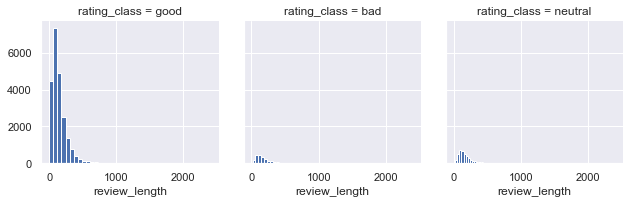

In [174]:
# Plotting review length histograms in the separate rating classes
plt.figure(figsize =(10,8))
g = sns.FacetGrid(data=df2, col='rating_class')
g.map(plt.hist, 'review_length', bins=40)

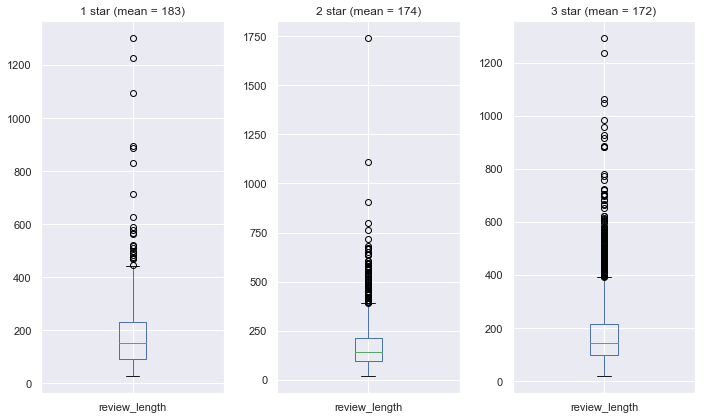

In [167]:
# Average review length based on the star rating
star_review_lengths = {star: df2['review_length'][df2['rating'] == star] for star in range(1,4)}

plt.figure(figsize=(10,6))

for star in range(1,4):
    plt.subplot(1,3,star)
    star_review_lengths[star].plot(kind='box')
    average_length = str( int( round( np.mean(star_review_lengths[star]) , 0) ) )
    plt.title( str(star) + ' star (mean = '+ average_length +')' )
    plt.suptitle("")
    
plt.tight_layout()    
plt.show()

Comment:?
    
* There is a very slight negative correlation between Review Length and Rating Classes. 
* Most of the reviewvs have less than 200 words.
* Boxplots show us that customers tend to using more words when they give 2 , 3 and 4 ratings.    

**Review Length and Feedback**

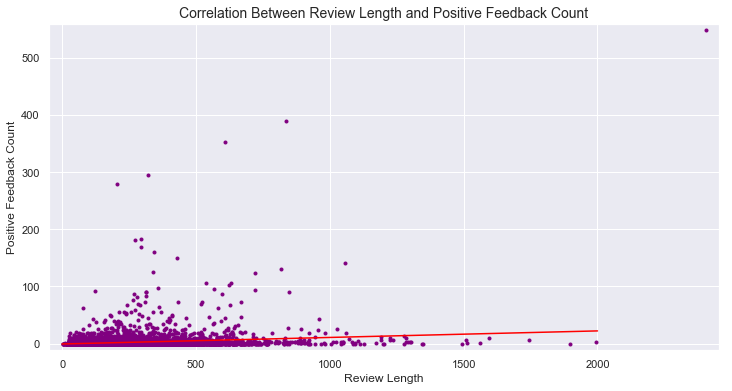

In [76]:
# Ploting the relationship between review length and positive feedback 
sns.set()
plt.figure(figsize = (12,6))
_ = plt.scatter(df2['review_length'], df2['pos_feedback'], color = 'purple', marker = '.', norm = True)

xm, ym = np.polyfit(df2['review_length'], df2['pos_feedback'], 1)

# Make theoretical line to plot
x = np.array([0,2000])

y_m = xm * x + ym

# Add regression line to your plot
_ = plt.plot(x, y_m, color='red')
_ = plt.ylabel('Positive Feedback Count')
_ = plt.xlabel('Review Length')
_ = plt.title('Correlation Between Review Length and Positive Feedback Count', size = 14)
plt.margins(0.02)

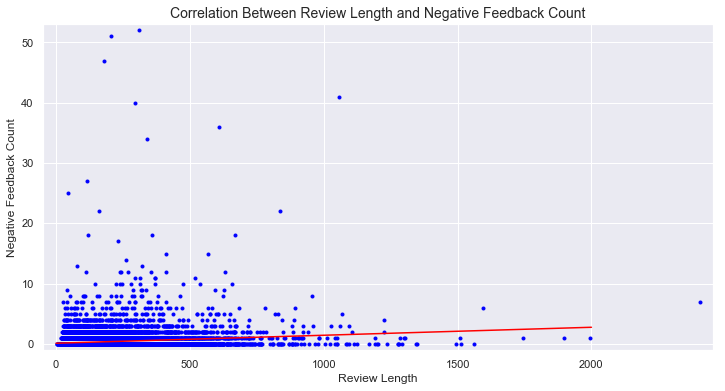

In [77]:
# Ploting the relationship between review length and negative feedback 
sns.set()
plt.figure(figsize = (12,6))
_ = plt.scatter(df2['review_length'], df2['neg_feedback'], color = 'blue', marker = '.', norm = True)

xm, ym = np.polyfit(df2['review_length'], df2['neg_feedback'], 1)

# Make theoretical line to plot
x = np.array([0,2000])
y_m = xm * x + ym

# Add regression line to your plot
_ = plt.plot(x, y_m, color='red')
_ = plt.ylabel('Negative Feedback Count')
_ = plt.xlabel('Review Length')
_ = plt.title('Correlation Between Review Length and Negative Feedback Count', size = 14)
plt.margins(0.02)

Comment: ?
    
There is a positive corelation between feedbacks and review length.

But this relationships are not strong.   

**Correlation Between Numeric Variables**

<Figure size 864x432 with 0 Axes>

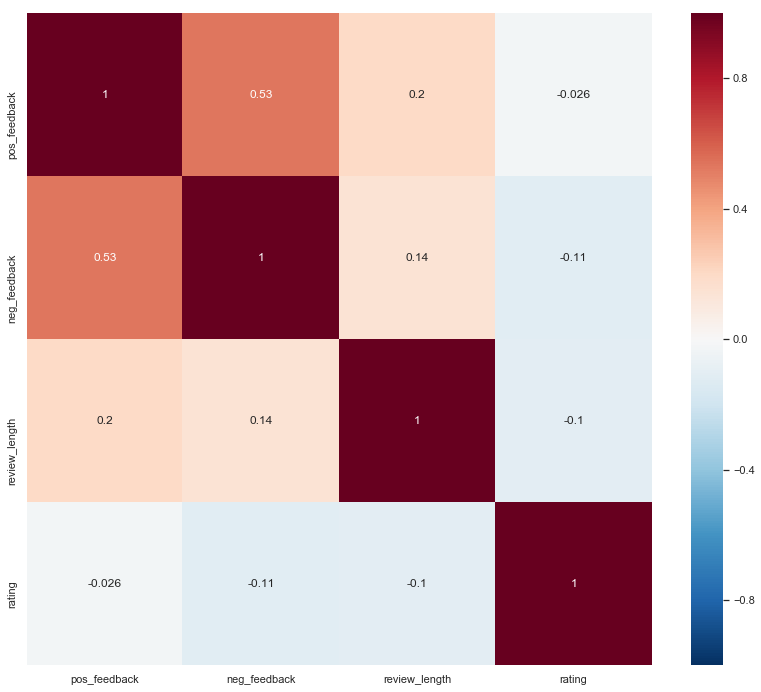

In [81]:
# Plotting correlation matrix between numeric variables
corr = df2[['pos_feedback', 'neg_feedback', 'review_length', 'rating']].corr(method="pearson")
# display(correlation)
fig3 = plt.figure()
plt.figure(figsize=(14, 12))
heatmap = sns.heatmap(corr, annot=True, linewidths=0, vmin=-1, cmap="RdBu_r")

There is no strong correlation between any two numeric variables. 

# 5. Text Review Feature

In [90]:
# Create a dataframe which shows the relationship between review numbers and rating classes for each year
def table_df(x, y, z, k): 
    """
    This function creates a dataframe for each rating class 
    """
    df2['rating_class_num'] = df2['rating_class'].map({'good': x, 'bad': y, 'neutral': z})
    
    feature = df2.groupby('year').agg({'rating_class_num':['size', 'sum', 'mean']})
    feature.columns = [' '.join(col).strip() for col in feature.columns.values]
    feature = feature.reset_index()
    feature['rating_class_num mean'] = feature['rating_class_num mean']*100
    feature.columns = ['Year', 'Total Reviews', 'Relevant Rating Number', 
                       '% of Relevant Rating Number in This Year'] 
    feature['% of Relevant Rating in the Total'] = (feature['Relevant Rating Number'] / k)*100
        
    return feature

In [91]:
# Create a graph for each rating class to compare within the years

def graph_df(title, x,y,z):
    """
    This function creates a graph for each rating class in the dataset
    """
    df2['rating_class_num'] = df2['rating_class'].map({'good': x, 'bad': y, 'neutral': z})
    
    feature = df2.groupby('year').agg({'rating_class_num':['size', 'sum', 'mean']})
    feature.columns = [' '.join(col).strip() for col in feature.columns.values]
    feature = feature.reset_index()
    feature['rating_class_num mean'] = feature['rating_class_num mean']*100
    feature.columns = ['Year', 'Total Reviews', 'Relevant Rating Number', 
                       '% of Relevant Rating Number in This Year'] 
    
    fig0, ax1 = plt.subplots()
    ax2 = ax1.twinx()
    feature.set_index(feature['Year'], drop=True, inplace=True)
    feature["Total Reviews"].plot(kind = 'bar', stacked = True, ax = ax1, colormap = 'winter')
                                   
    feature['% of Relevant Rating Number in This Year'].plot(use_index = False, 
                                                         kind = 'line', ax = ax2, colormap='Spectral')
    plt.title(title + " " + 'Rating Class Compared to the Each Year')
    ax1.set_xlabel('Year')
    ax1.yaxis.label.set_color('blue')
    ax1.set_ylabel("Total Reviews")
    ax2.set_ylabel("Rating Class Percentage in the Year")
    ax2.yaxis.label.set_color('red')
    plt.tight_layout()
    plt.show()

**Good Rating Class**

In [92]:
# Good Rating(4-5 stars) Class for each year
table_df(x=1, y=0, z=0, k=22425)

,Year,Total Reviews,Relevant Rating Number,% of Relevant Rating Number in This Year,% of Relevant Rating in the Total
0,2005,1,1,100.000000,0.004459
1,2007,44,28,63.636364,0.124861
2,2008,674,491,72.848665,2.189521
3,2009,892,654,73.318386,2.916388
4,2010,787,578,73.443456,2.577480
5,2011,836,578,69.138756,2.577480
6,2012,4649,3736,80.361368,16.659978
7,2013,11269,8644,76.706008,38.546265
8,2014,9424,7715,81.865450,34.403567


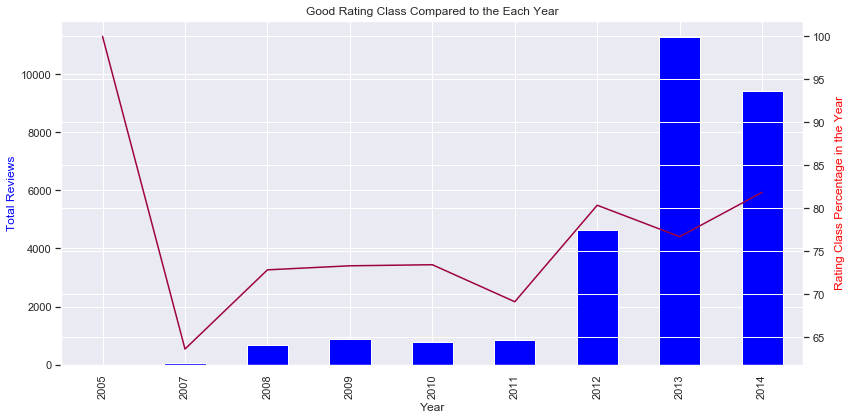

In [93]:
# Good Rating(4-5 starts) Class for each year
graph_df(title= "Good", x=1, y=0, z=0)

**Bad Rating Class**

In [94]:
# Bad Ratings(1-2) Statistics for each year
table_df(x=0, y=1, z=0, k=2084)

,Year,Total Reviews,Relevant Rating Number,% of Relevant Rating Number in This Year,% of Relevant Rating in the Total
0,2005,1,0,0.000000,0.000000
1,2007,44,4,9.090909,0.191939
2,2008,674,58,8.605341,2.783109
3,2009,892,67,7.511211,3.214971
4,2010,787,78,9.911055,3.742802
5,2011,836,102,12.200957,4.894434
6,2012,4649,343,7.377931,16.458733
7,2013,11269,846,7.507321,40.595010
8,2014,9424,586,6.218166,28.119002


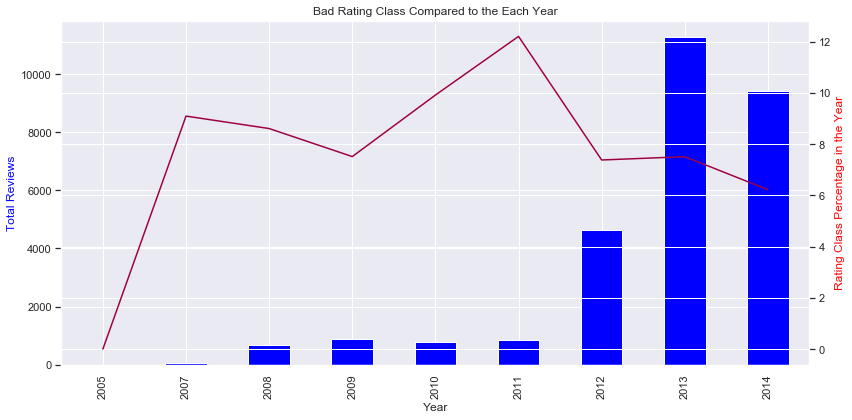

In [95]:
# Bad Rating(1-2 starts) Class for each year
graph_df(title= "Bad", x=0, y=1, z=0)

**Neutral Rating Class**

In [96]:
# Neutral Ratings(3) Statistics for each year
table_df(x=0, y=1, z=0, k=4067)

,Year,Total Reviews,Relevant Rating Number,% of Relevant Rating Number in This Year,% of Relevant Rating in the Total
0,2005,1,0,0.000000,0.000000
1,2007,44,4,9.090909,0.098353
2,2008,674,58,8.605341,1.426113
3,2009,892,67,7.511211,1.647406
4,2010,787,78,9.911055,1.917876
5,2011,836,102,12.200957,2.507991
6,2012,4649,343,7.377931,8.433735
7,2013,11269,846,7.507321,20.801574
8,2014,9424,586,6.218166,14.408655


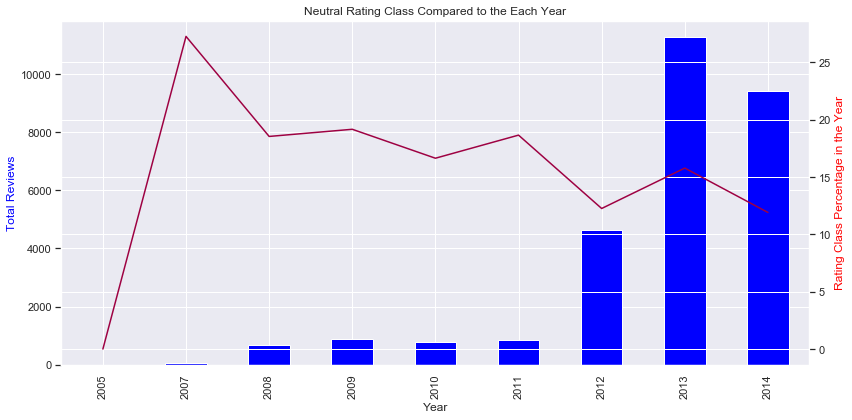

In [97]:
# Neutral Rating(3 starts) Class for each year
graph_df(title= "Neutral", x=0, y=0, z=1)

## Top 10 Words

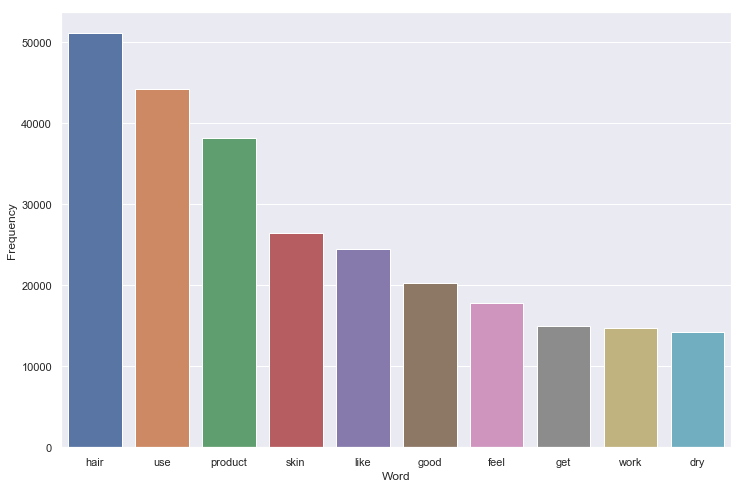

In [175]:
# Plotting top 10 words in the dataset
top_N = 100
cleaned_text = [str(txt) for text in df2['clean_text'] for txt in text.split(' ') 
                if len(txt)>2 and txt not in 'not, nan, one, two, three, four, five, six, seven, eight, nine']

word_dist = nltk.FreqDist(cleaned_text)
rslt = pd.DataFrame(word_dist.most_common(top_N),
                    columns=['Word', 'Frequency'])

plt.figure(figsize=(12,8))
sns.set()
ax = sns.barplot(x="Word",y="Frequency", data=rslt.head(10))

## Most Common Words with Rating Classes

In [102]:
# Creating dataframe for separate rating classes
good = df2.loc[df2['rating_class'] == 'good']
neutral = df2.loc[df2['rating_class'] == 'neutral']
bad = df2.loc[df2['rating_class'] == 'bad']

good_r = good['clean_text']
neutral_r = neutral['clean_text']
bad_r = bad['clean_text']

In [103]:
#  Defining most commonly used words overall and for each separate rating classes
fd = nltk.FreqDist([y for x in df2['clean_text'].str.split() for y in x])

fd_good = nltk.FreqDist([y for x in good_r.str.split() for y in x])
fd_neutral = nltk.FreqDist([y for x in neutral_r.str.split() for y in x])
fd_bad = nltk.FreqDist([y for x in bad_r.str.split() for y in x])

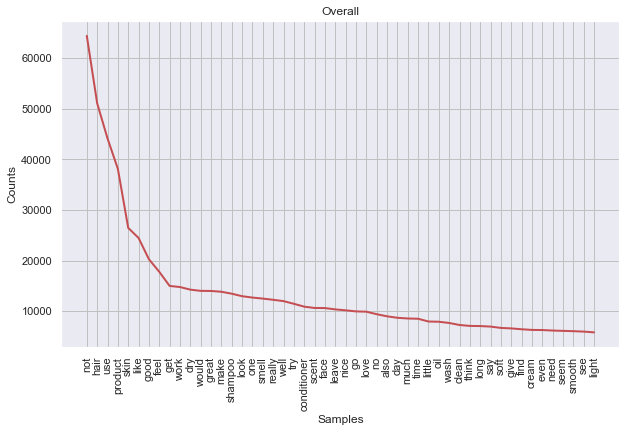

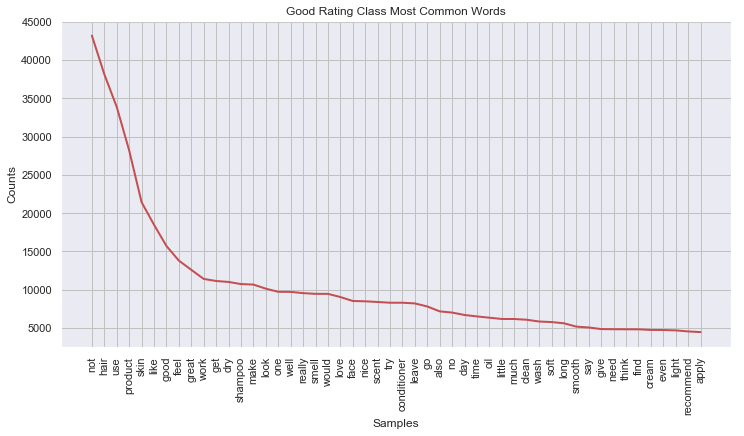

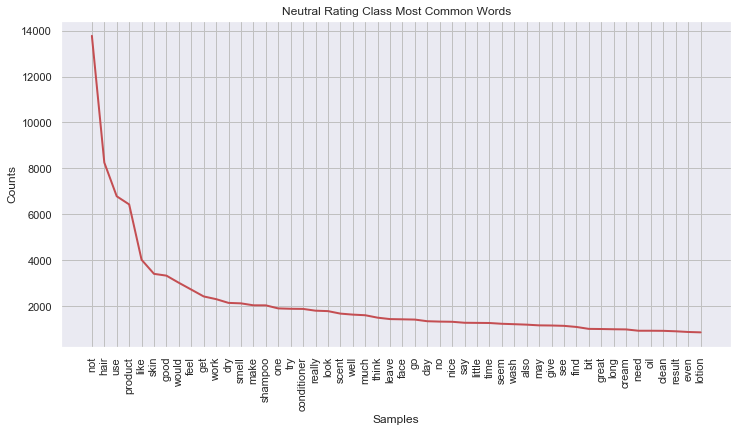

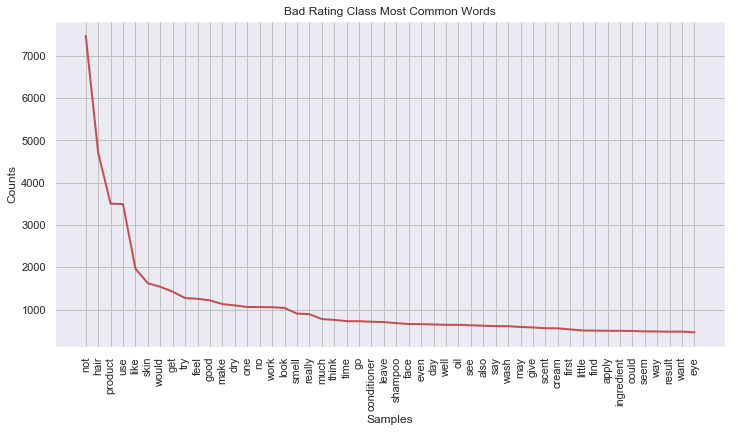

In [159]:
# Plotting most common used words in overall and three rating classes
plt.figure(figsize = (10,6))
fd.plot(50, title='Overall', color = "r")
fd_good.plot(50, title='Good Rating Class Most Common Words', color = "r")
fd_neutral.plot(50, title='Neutral Rating Class Most Common Words', color = "r")
fd_bad.plot(50, title='Bad Rating Class Most Common Words', color = "r")

Comments: ?
     Most significant infrence of text graphs is that there is a great number of matching words among review texts of different rating classes

## WordCloud

## Wordcloud with All Ratings

In [5]:
cleaned_text_all = [str(txt) for text in df2['clean_text'] for txt in text.split(' ') 
                    if len(txt)>2 and txt not in 'not, nan']

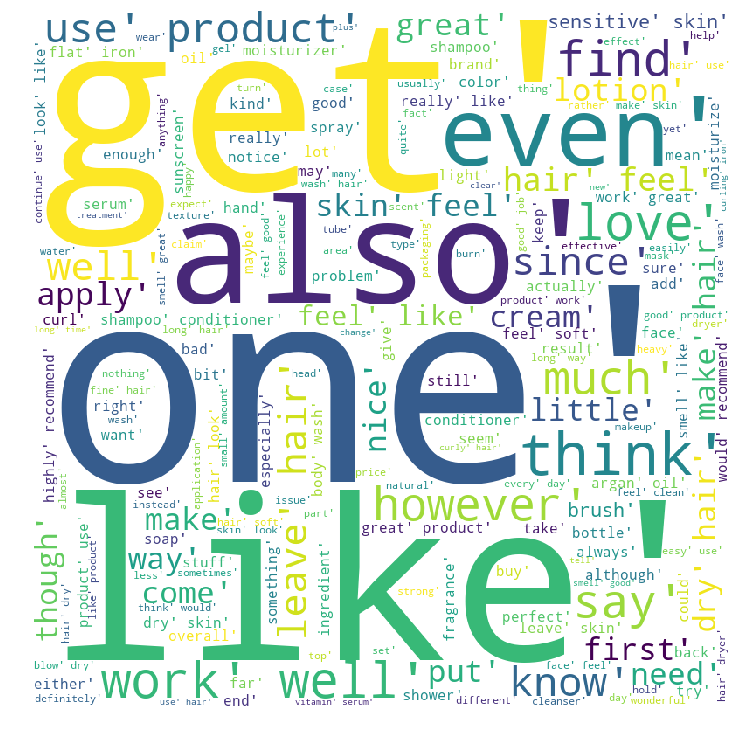

In [6]:
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                min_font_size = 10).generate(str(cleaned_text_all))
 
# plot the WordCloud image                       
plt.figure(figsize = (10, 10), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

## Wordcloud with Rating Class - "good"

In [11]:
# Create a function for extracting most common words in three rating classes
def word_cloud(rating_class = 'good'):
    
    """
    This function extracts most used words in the reviews.
    """
    
    cleaned_text = [str(txt) for text in df2[df2['rating_class'] == rating_class]['clean_text'] for txt in text.split(' ') 
                    if len(txt)>2 and txt not in 'not, nan']
    
    wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                min_font_size = 10).generate(str(cleaned_text))

    # plot the WordCloud image
    plt.figure(figsize = (10,10), facecolor = None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad = 0)
    plt.show()

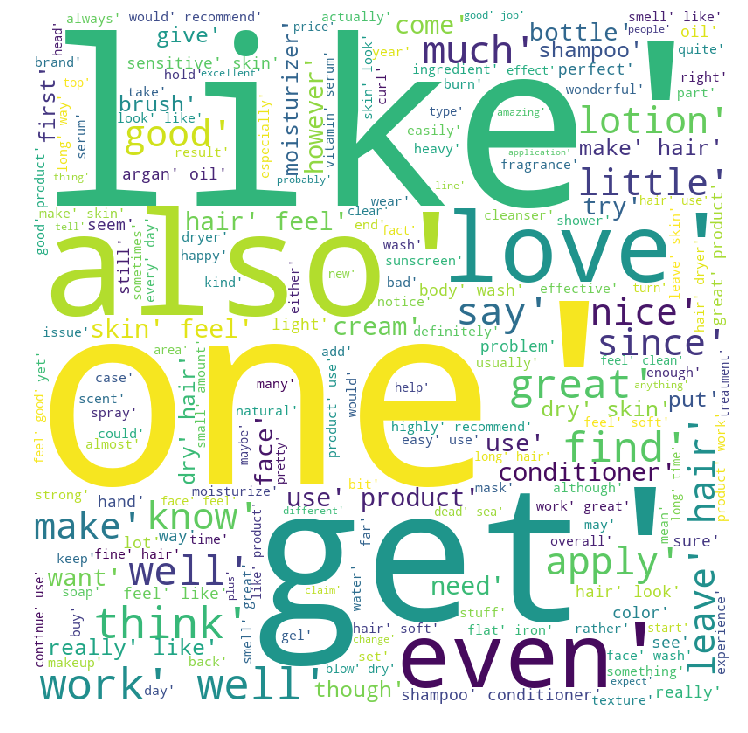

In [12]:
# Most common words used in 'good' rating class
word_cloud(rating_class = 'good')

## Wordcloud with Rating Class - "neutral"

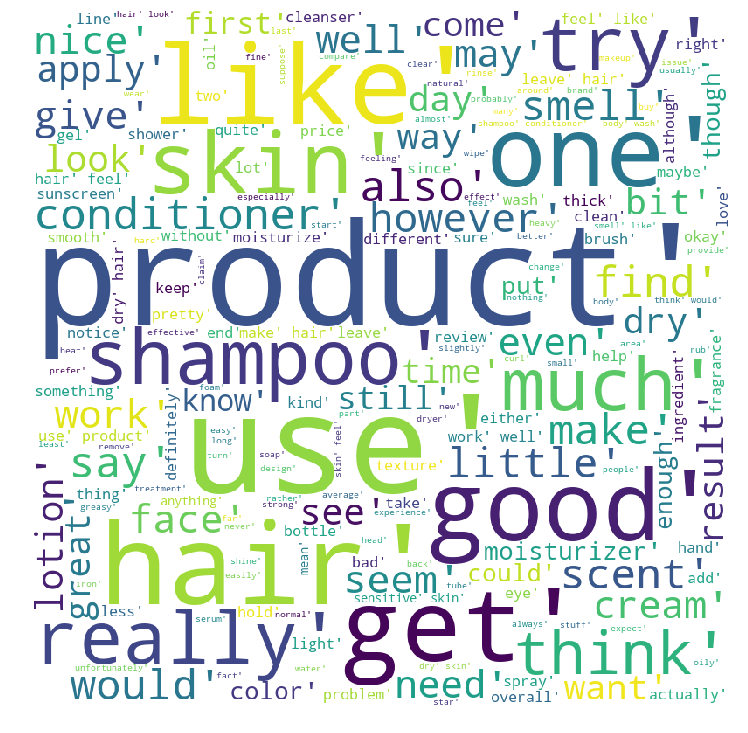

In [13]:
# Most common words used in 'neutral' rating class
word_cloud(rating_class = 'neutral')

## Wordcloud with Rating Class - "bad"

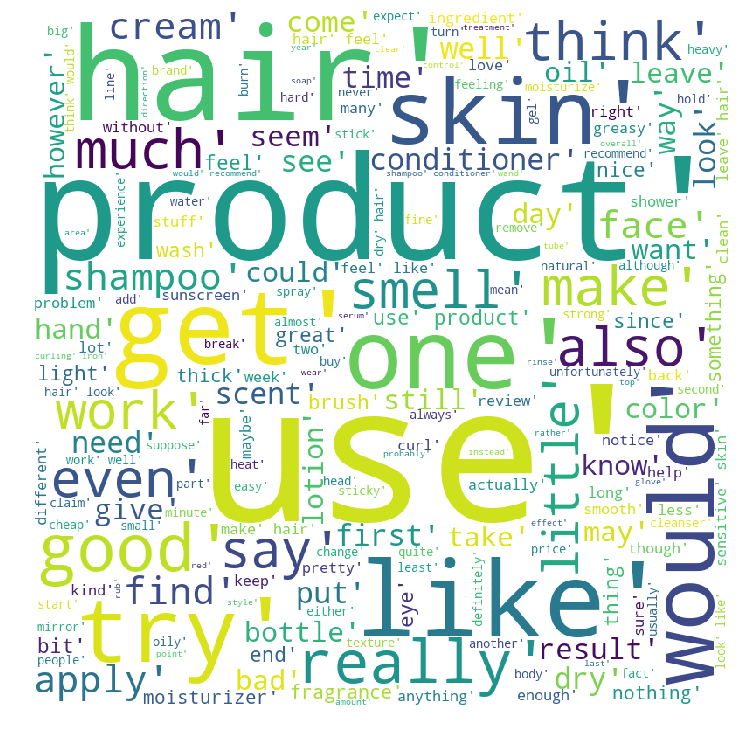

In [14]:
# Most common words used in 'bad' rating class
word_cloud(rating_class = 'bad')

# Exploratory Data Analysis Summary:

* There is an imbalance between rating classes, especially 1 and 2 ratings have small portions according to other classes.

* Most of the customers gave less than 8 reviews (mean = 7.87) but there are also oulier customers who have a large number of reviews. A great number of reviews which are made by a single customer may effect the objectiveness and so the test score negatively.

* Customer uniquness of 4 and 5 ratings are low, it means they are populated by same customers. This may bring the same above drawbacks.

* Most of the products have less than 14 reviews (mean = 13.79). Product which have been received more than mean can be analysed differently for extracting the strong issues about the products. For instance, cronical problems can be easliy detected in this way.

* There is a negative corelations between number of feedbacks and rating classes are not strong. But outlier feedbacks can provide additional information.

* Most of the reviewvs have less than 200 words. And customers tend to using more words when they give 2 , 3 and 4 ratings.

* There is no strong correlation between any two numeric variables.

* Most significant infrence of text graphs is that there is a great number of matching words among review texts of different rating classes

Recap crucial points:
   * There is no strong relationship between numeric predictors and target variable

   * Data set is imbalanced in regards of rating classes.

   * There is a great number of matching words among rating classes.